<a href="https://colab.research.google.com/github/iamstarstuff/ImageDeblur/blob/main/ImageDeblurring.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Pratik Barve - C00290846
## MSc Data Science, SETU
## Data Analytics and Algorithms Project

# Image Deblurring

Image blurring is a very common problem when it comes to CCTV surveilance, sports, or even general day to day pictures clicked by people or machines. The blurring can be due to motion of camera or smudged/unclean optics. Sometimes due to this blurring curcial data might be lost, especially when it comes to CCTV surveilence. For this purposes we can use machine learning algorithms to deblur these images and recover/reconstruct as much data as we can.

For this project I will be using the [HIDE (High-quality Dyanamic Images with Extensive motion)](https://github.com/joanshen0508/HA_deblur) dataset that has been developed by intentionally blurring images to simulate motion blur. This dataset is accompanied by the ground truth images that are sharp and can be used to train the models.

The full dataset size is about 18 GB. Using the full resolution images is impossible due to computational limitations. So we reduce all the image sizes to 128 x 128 pixels. 

In [ ]:
import os
import cv2
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import tensorflow as tf

Due to the intense computational requirements, I purchased colab pro subscription and used NVIDIA A100 GPUs with 40GB of memory. This significantly increased the training speed and it takes less than 5 minutes for 100 epochs. For comparison, the same code took 20 hours for 25 epochs on laptop.

In [ ]:
# Getting the GPU info
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Wed May 10 06:27:06 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA A100-SXM...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   32C    P0    52W / 400W |  13953MiB / 40960MiB |      0%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
# Making sure the GPU is connected and will be used
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)

gpus

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

### Resizing images and setting paths

The code below was used to resize the images to 128 x 128 pixels. Please do not run it again as it takes more than 40 minutes to resize 8422 images.

I further reorganised the folders by merging the predivided train and test folders and then using the train-test-split for random splitting.



In [ ]:
# for directory in ['GT','train','test']:
#     for image_name in os.listdir(os.path.join(base_path,"resizedimages/",directory)):
#         if image_name[0] != ".":
#             img = Image.open(os.path.join(base_path,"resizedimages/",directory,image_name))
#             img = img.resize((128,128))
#             output_path = os.path.join(base_path, "resizedimages2/",directory,image_name)
#             img.save(output_path)
#         else:
#             continue

In [ ]:
base_path = "/content/drive/MyDrive/DeblurringProject/HIDE/"

In [ ]:
train_path = os.path.join(base_path, "resizedimages3/train/")
gt_path = os.path.join(base_path, "resizedimages3/GT/")

In [ ]:
# len(os.listdir(train_path))

In [ ]:
# len(os.listdir(gt_path))

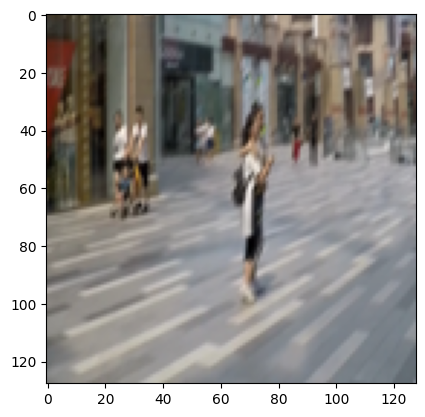

In [ ]:
plt.imshow(plt.imread(os.path.join(train_path, os.listdir(train_path)[0])))

### Reading the images and saving them as numpy array file.

.npz is compressed numpy array file and this makes reading the image files much faster than reading each image one at a time everytime the code is executed.

In [ ]:
'''
X = []
y = []

for img in os.listdir(train_path):
    X.append(plt.imread(os.path.join(train_path,img)))
    y.append(plt.imread(os.path.join(gt_path,img)))

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Saving numpy arrays as npz files in Google Drive
np.savez('/content/drive/MyDrive/DeblurringProject/traintest.npz',
          X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test)
'''

In [ ]:
# Loading numpy arrays from the saved npz file in Google Drive
data = np.load('/content/drive/MyDrive/DeblurringProject/traintest.npz')
X_train = data['X_train']
y_train = data['y_train']
X_test = data['X_test']
y_test = data['y_test']

In [ ]:
y_test.shape

(1685, 128, 128, 3)

# Algorithms

## Autoencoders

Autoencoders are a type of Neural networks that can be used for unsupervised learning tasks. Autoencoders are typically used for image deblurring, denoising and compression. The basic idea is we use neural network to compress an input image into lower dimensions and then reconstruct the image.

The first half of compressing the image is done by encoders and the second half of reconstructing the images is done by decoders. Due to this it is important that the filter layers of encoder and decoder must match or be symmetric.

During the training process, the autoencoder is fed with pairs of input images and their corresponding "ground truth" images (in this case, the blurry images and their clear counterparts from the HIDE dataset). The autoencoder learns to minimize the difference between the reconstructed images and the ground truth images, typically by using a loss function such as mean squared error (MSE).

In training process the foward pass is upto the point where difference between reconstructed and ground truth image is calculated. In backward pass this error is propogated backward through the network using back propogation and the weights of the network are updated to minimize the loss. This process is repeated (which is called epochs) to increase accuracy of reconstructed images.

In [ ]:
from tensorflow.keras.layers import Dense, Input
from tensorflow.keras.layers import Conv2D, Flatten
from tensorflow.keras.layers import Reshape, Conv2DTranspose
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.utils import plot_model
from tensorflow.keras import backend as K
from tensorflow.keras import layers

In [ ]:
# Setting the parameters

latent_dimension = 256
batch_size = 16
kernel_size = 3

1. `latent_dimension`: This sets the dimensionality of the compressed image. Higher values require higher computational resources. Here I have used the typically used parameters.
2. `batch_size`: Sets the number of samples processed in each training batch. A larger batch size can lead to faster convergence but requires much more RAM.
3. `kernel_size`: Sets the size of convolutional kernel which is the size of window that is used to convolve over input data in CNN. Smaller kernel size captures fine detals but can result in overfitting. 

An interactive website called [CNN Explainer](https://poloclub.github.io/cnn-explainer/) is an amazing tool to visualise definitions of this parameters.


### Encoder


In [ ]:
input_img = layers.Input(shape=(128,128,3))
e1 = layers.Conv2D(64,kernel_size=kernel_size, strides=2, padding='same',
                  activation='relu', name='e1')(input_img)

e2 = layers.Conv2D(128,kernel_size=kernel_size, strides=2, padding='same',activation='relu',name='e2')(e1)

e3 = layers.Conv2D(256, kernel_size=kernel_size, strides=2, padding='same',activation='relu',name='e3')(e2)

e4 = layers.Flatten(name='e4_flatten')(e3)

# shape of the matrix before flattening
encoder_shape = e3.shape

encoded = layers.Dense(latent_dimension, name='latent_vector')(e4)
encoder = tf.keras.Model(input_img,encoded, name='encoder')
encoder.summary()

Model: "encoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 e1 (Conv2D)                 (None, 64, 64, 64)        1792      
                                                                 
 e2 (Conv2D)                 (None, 32, 32, 128)       73856     
                                                                 
 e3 (Conv2D)                 (None, 16, 16, 256)       295168    
                                                                 
 e4_flatten (Flatten)        (None, 65536)             0         
                                                                 
 latent_vector (Dense)       (None, 256)               16777472  
                                                                 
Total params: 17,148,288
Trainable params: 17,148,288
Non-t

The input to the encoder is a 3-channel image with a height and width of 128 pixels, defined by the Input layer with shape `(128,128,3)`.

The encoder consists of four convolutional layers with increasing number of filters, specified by the `Conv2D` layers with kernel size of `kernel_size`, `stride` of 2, and 'same' padding. Each convolutional layer uses `ReLU` activation function to introduce non-linearity and improve the performance of the neural network. The first layer, `e1`, has 64 filters, the second layer, `e2`, has 128 filters, the third layer, `e3`, has 256 filters, and the last layer is a flattened layer named `e4_flatten`.

The Flatten layer reshapes the output of the third convolutional layer, `e3`, into a one-dimensional tensor, which will be used as the input to the fully connected layer.

The encoded layer is a fully connected layer that maps the flattened output of `e4_flatten` to a lower-dimensional latent space representation of the input image. The latent_dimension specifies the size of the latent vector, which is 256 in this case.

Further we can see the summary of the model and verify shapes of each layer. This is important as our decoder architecture will be based on this.

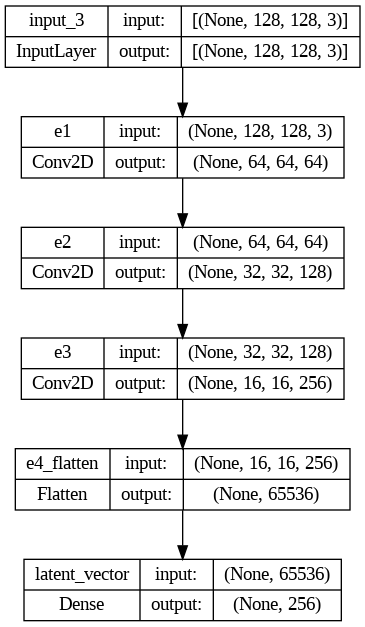

In [ ]:
tf.keras.utils.plot_model(encoder, to_file='encoder.png', show_shapes=True)

### Decoder

In [ ]:
decoder_input= layers.Input(shape=(latent_dimension))
d1 = layers.Dense(encoder_shape[1]*encoder_shape[2]*encoder_shape[3])(decoder_input)
d2 = layers.Reshape((encoder_shape[1],encoder_shape[2], encoder_shape[3]))(d1)
d3 = layers.Conv2DTranspose(256, kernel_size=kernel_size, strides=2, padding='same',activation='relu')(d2)
d4 = layers.Conv2DTranspose(128, kernel_size=kernel_size, strides=2, padding='same',activation='relu')(d3)
d5 = layers.Conv2DTranspose(64, kernel_size=kernel_size,strides=2, padding='same', activation='relu')(d4)
d6 = layers.Conv2DTranspose(3,kernel_size=kernel_size, activation='sigmoid',padding='same', name='decoder_output')(d5)
decoder = tf.keras.Model(decoder_input, d6,name="decoder")
decoder.summary()

Model: "decoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 256)]             0         
                                                                 
 dense_3 (Dense)             (None, 65536)             16842752  
                                                                 
 reshape_2 (Reshape)         (None, 16, 16, 256)       0         
                                                                 
 conv2d_transpose_6 (Conv2DT  (None, 32, 32, 256)      590080    
 ranspose)                                                       
                                                                 
 conv2d_transpose_7 (Conv2DT  (None, 64, 64, 128)      295040    
 ranspose)                                                       
                                                                 
 conv2d_transpose_8 (Conv2DT  (None, 128, 128, 64)     7379

The decoder takes as input the encoded representation of the input image, which is a vector of size `latent_dimension`.

The decoder network consists of a dense layer (`d1`) that converts the encoded vector to a tensor of size (encoder_shape[1], encoder_shape[2], encoder_shape[3]). This tensor is then reshaped to the shape of the output of the last layer of the encoder network (`d2`).

The reshaped tensor is then fed through a series of transposed convolutional layers (`d3`, `d4`, `d5`), which gradually increase the spatial dimensions of the tensor while decreasing the number of channels. The final layer (`d6`) produces the output image of size (128, 128, 3) using the sigmoid activation function.

We can observe that the architecture of decoder is like a mirror image of the encoder. When the autoencoder is trained, the encoder learns to capture the essential features of the input image in the encoded vector, while the decoder learns to use this vector to reconstruct the original image as closely as possible.

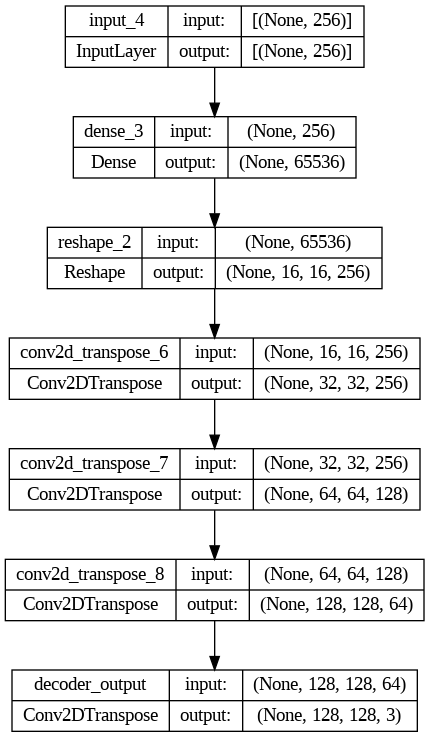

In [ ]:
tf.keras.utils.plot_model(decoder, to_file='decoder.png', show_shapes=True)

### Creating instance of autoencoder

In [ ]:
autoencoder = Model(input_img, decoder(encoder(input_img)), name='autoencoder')
autoencoder.summary()

# Compile and train the model
autoencoder.compile(loss='mse', optimizer = 'adam', metrics=["acc"])

lr_reducer = ReduceLROnPlateau(factor=np.sqrt(0.1),
                               cooldown=0,
                               patience=5,
                               verbose=1,
                               min_lr=0.5e-6)

class ImageCallback(tf.keras.callbacks.Callback):
    def __init__(self, image, frequency):
        super(ImageCallback, self).__init__()
        self.image = image
        self.frequency = frequency

    def on_epoch_end(self, epoch, logs=None):
        if epoch % self.frequency == 0:
            reconstructed_image = self.model.predict(self.image.reshape(1,128,128,3))
            
            
            fig, ax = plt.subplots(1,2)
            ax[0].imshow(self.image)
            ax[0].set_title("Original Image (blurred)")
            ax[1].imshow(reconstructed_image[0])
            ax[1].set_title("Reconstructed Deblurred Image")
            plt.show()

image_callback = ImageCallback(X_test[22],frequency=5)
cbs = [lr_reducer, image_callback]


Model: "autoencoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 encoder (Functional)        (None, 256)               17148288  
                                                                 
 decoder (Functional)        (None, 128, 128, 3)       17803395  
                                                                 
Total params: 34,951,683
Trainable params: 34,951,683
Non-trainable params: 0
_________________________________________________________________


The input and output of the autoencoder model is the same as the input image. It uses the mean squared error (MSE) loss function and the `Adam` optimizer for training.

The `ReduceLROnPlateau` callback is used to decrease the learning rate of the optimizer if the validation loss does not improve after a certain number of epochs. This can help the model converge to a better solution.

I defined `ImageCallback` class is to display a sample image from the test set and its reconstructed deblurred version every 5 epochs during training. THis was done in order to visualize the progress of the model in learning to deblur the images. This also helps to stop the training if we are not satisfied with the outcome.

These two callbacks are then added to a list of callbacks cbs which is passed to the fit method during training.

Epoch 1/100
1/1 [==============================] - 0s 148ms/step


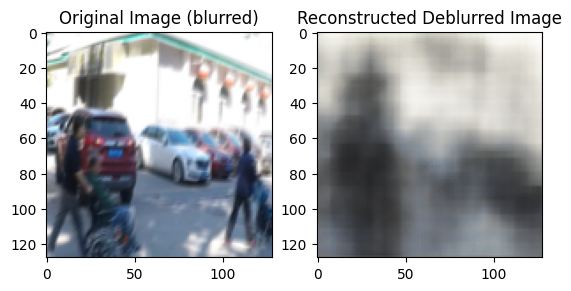

422/422 [==============================] - 10s 15ms/step - loss: 0.0279 - acc: 0.4025 - val_loss: 0.0207 - val_acc: 0.4764 - lr: 0.0010
Epoch 2/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0169 - acc: 0.5215 - val_loss: 0.0160 - val_acc: 0.5639 - lr: 0.0010
Epoch 3/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0140 - acc: 0.5860 - val_loss: 0.0143 - val_acc: 0.5773 - lr: 0.0010
Epoch 4/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0120 - acc: 0.6335 - val_loss: 0.0120 - val_acc: 0.6456 - lr: 0.0010
Epoch 5/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0106 - acc: 0.6656 - val_loss: 0.0112 - val_acc: 0.6509 - lr: 0.0010
Epoch 6/100
1/1 [==============================] - 0s 21ms/step


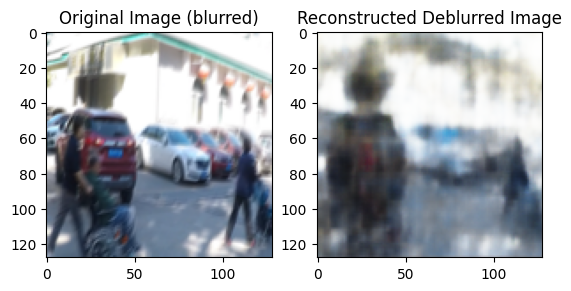

422/422 [==============================] - 5s 13ms/step - loss: 0.0096 - acc: 0.6868 - val_loss: 0.0111 - val_acc: 0.6783 - lr: 0.0010
Epoch 7/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0088 - acc: 0.6975 - val_loss: 0.0113 - val_acc: 0.6833 - lr: 0.0010
Epoch 8/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0081 - acc: 0.7104 - val_loss: 0.0098 - val_acc: 0.6904 - lr: 0.0010
Epoch 9/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0075 - acc: 0.7180 - val_loss: 0.0096 - val_acc: 0.6992 - lr: 0.0010
Epoch 10/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0070 - acc: 0.7247 - val_loss: 0.0095 - val_acc: 0.7056 - lr: 0.0010
Epoch 11/100
1/1 [==============================] - 0s 21ms/step


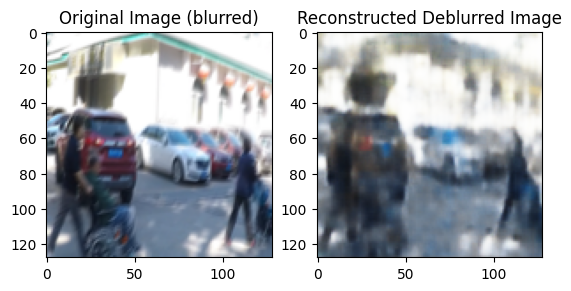

422/422 [==============================] - 5s 13ms/step - loss: 0.0068 - acc: 0.7274 - val_loss: 0.0093 - val_acc: 0.7146 - lr: 0.0010
Epoch 12/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0062 - acc: 0.7368 - val_loss: 0.0091 - val_acc: 0.7087 - lr: 0.0010
Epoch 13/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0059 - acc: 0.7413 - val_loss: 0.0089 - val_acc: 0.7202 - lr: 0.0010
Epoch 14/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0056 - acc: 0.7451 - val_loss: 0.0088 - val_acc: 0.7261 - lr: 0.0010
Epoch 15/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0055 - acc: 0.7481 - val_loss: 0.0089 - val_acc: 0.7283 - lr: 0.0010
Epoch 16/100
1/1 [==============================] - 0s 20ms/step


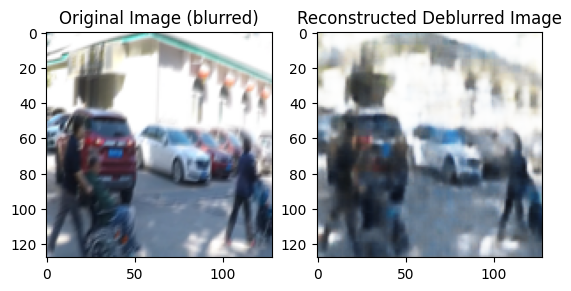

422/422 [==============================] - 5s 13ms/step - loss: 0.0054 - acc: 0.7494 - val_loss: 0.0088 - val_acc: 0.7167 - lr: 0.0010
Epoch 17/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0050 - acc: 0.7547 - val_loss: 0.0086 - val_acc: 0.7337 - lr: 0.0010
Epoch 18/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0048 - acc: 0.7567 - val_loss: 0.0085 - val_acc: 0.7327 - lr: 0.0010
Epoch 19/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0047 - acc: 0.7591 - val_loss: 0.0084 - val_acc: 0.7315 - lr: 0.0010
Epoch 20/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0046 - acc: 0.7611 - val_loss: 0.0084 - val_acc: 0.7389 - lr: 0.0010
Epoch 21/100
1/1 [==============================] - 0s 21ms/step


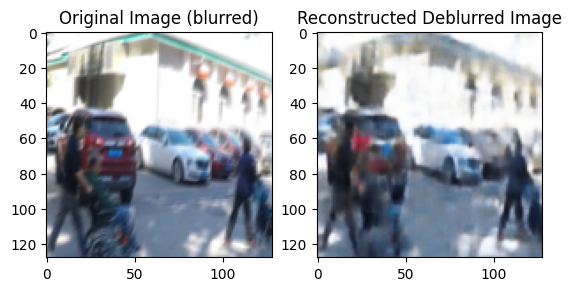

422/422 [==============================] - 5s 13ms/step - loss: 0.0044 - acc: 0.7640 - val_loss: 0.0084 - val_acc: 0.7405 - lr: 0.0010
Epoch 22/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0043 - acc: 0.7646 - val_loss: 0.0084 - val_acc: 0.7296 - lr: 0.0010
Epoch 23/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0042 - acc: 0.7678 - val_loss: 0.0082 - val_acc: 0.7455 - lr: 0.0010
Epoch 24/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0041 - acc: 0.7692 - val_loss: 0.0083 - val_acc: 0.7474 - lr: 0.0010
Epoch 25/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0040 - acc: 0.7707 - val_loss: 0.0085 - val_acc: 0.7487 - lr: 0.0010
Epoch 26/100
1/1 [==============================] - 0s 21ms/step


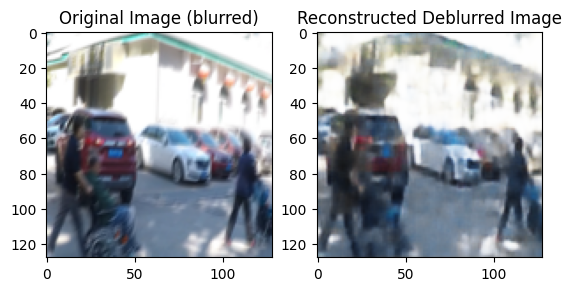

422/422 [==============================] - 5s 13ms/step - loss: 0.0039 - acc: 0.7726 - val_loss: 0.0082 - val_acc: 0.7450 - lr: 0.0010
Epoch 27/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0039 - acc: 0.7737 - val_loss: 0.0082 - val_acc: 0.7389 - lr: 0.0010
Epoch 28/100
420/422 [============================>.] - ETA: 0s - loss: 0.0037 - acc: 0.7751
Epoch 28: ReduceLROnPlateau reducing learning rate to 0.00031622778103685084.
422/422 [==============================] - 5s 12ms/step - loss: 0.0037 - acc: 0.7751 - val_loss: 0.0083 - val_acc: 0.7215 - lr: 0.0010
Epoch 29/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0032 - acc: 0.7820 - val_loss: 0.0078 - val_acc: 0.7494 - lr: 3.1623e-04
Epoch 30/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0030 - acc: 0.7849 - val_loss: 0.0078 - val_acc: 0.7562 - lr: 3.1623e-04
Epoch 31/100
1/1 [==============================] - 0s 21ms/step


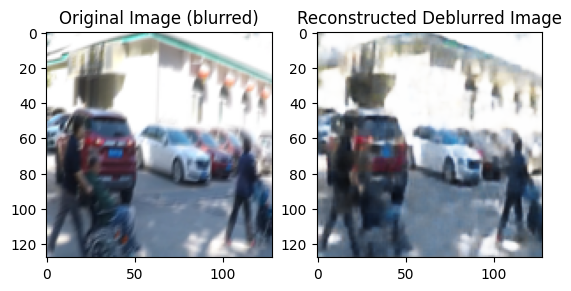

422/422 [==============================] - 5s 13ms/step - loss: 0.0029 - acc: 0.7861 - val_loss: 0.0078 - val_acc: 0.7531 - lr: 3.1623e-04
Epoch 32/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0028 - acc: 0.7870 - val_loss: 0.0078 - val_acc: 0.7578 - lr: 3.1623e-04
Epoch 33/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0028 - acc: 0.7878 - val_loss: 0.0078 - val_acc: 0.7548 - lr: 3.1623e-04
Epoch 34/100
419/422 [============================>.] - ETA: 0s - loss: 0.0027 - acc: 0.7885
Epoch 34: ReduceLROnPlateau reducing learning rate to 0.00010000000639606199.
422/422 [==============================] - 5s 12ms/step - loss: 0.0027 - acc: 0.7885 - val_loss: 0.0079 - val_acc: 0.7582 - lr: 3.1623e-04
Epoch 35/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0026 - acc: 0.7904 - val_loss: 0.0079 - val_acc: 0.7571 - lr: 1.0000e-04
Epoch 36/100
1/1 [==============================] - 0s 21ms/step


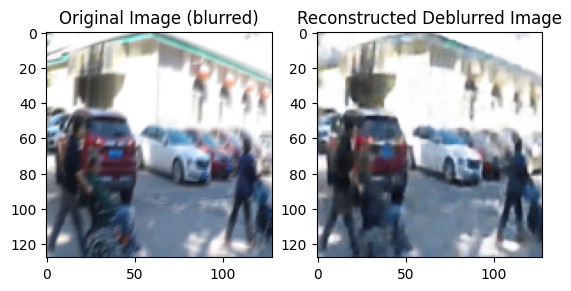

422/422 [==============================] - 5s 13ms/step - loss: 0.0026 - acc: 0.7907 - val_loss: 0.0079 - val_acc: 0.7598 - lr: 1.0000e-04
Epoch 37/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0026 - acc: 0.7912 - val_loss: 0.0079 - val_acc: 0.7559 - lr: 1.0000e-04
Epoch 38/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0025 - acc: 0.7914 - val_loss: 0.0079 - val_acc: 0.7568 - lr: 1.0000e-04
Epoch 39/100
420/422 [============================>.] - ETA: 0s - loss: 0.0025 - acc: 0.7917
Epoch 39: ReduceLROnPlateau reducing learning rate to 3.1622778103685084e-05.
422/422 [==============================] - 5s 12ms/step - loss: 0.0025 - acc: 0.7916 - val_loss: 0.0079 - val_acc: 0.7602 - lr: 1.0000e-04
Epoch 40/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0025 - acc: 0.7924 - val_loss: 0.0079 - val_acc: 0.7565 - lr: 3.1623e-05
Epoch 41/100
1/1 [==============================] - 0s 22ms/step


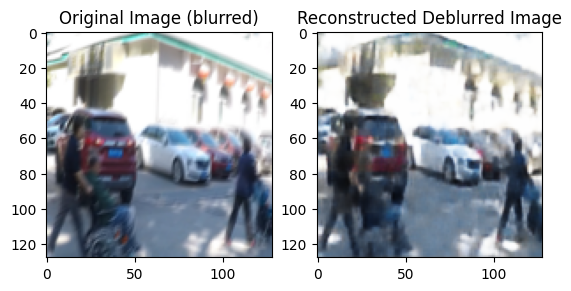

422/422 [==============================] - 6s 13ms/step - loss: 0.0025 - acc: 0.7923 - val_loss: 0.0079 - val_acc: 0.7585 - lr: 3.1623e-05
Epoch 42/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0025 - acc: 0.7926 - val_loss: 0.0079 - val_acc: 0.7582 - lr: 3.1623e-05
Epoch 43/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0025 - acc: 0.7926 - val_loss: 0.0079 - val_acc: 0.7578 - lr: 3.1623e-05
Epoch 44/100
421/422 [============================>.] - ETA: 0s - loss: 0.0025 - acc: 0.7928
Epoch 44: ReduceLROnPlateau reducing learning rate to 1.0000000409520217e-05.
422/422 [==============================] - 5s 12ms/step - loss: 0.0025 - acc: 0.7928 - val_loss: 0.0079 - val_acc: 0.7580 - lr: 3.1623e-05
Epoch 45/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7930 - val_loss: 0.0079 - val_acc: 0.7573 - lr: 1.0000e-05
Epoch 46/100
1/1 [==============================] - 0s 21ms/step


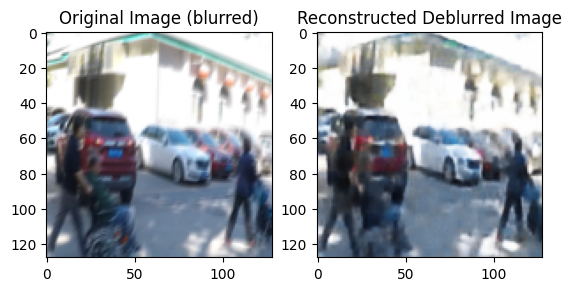

422/422 [==============================] - 5s 13ms/step - loss: 0.0024 - acc: 0.7929 - val_loss: 0.0080 - val_acc: 0.7593 - lr: 1.0000e-05
Epoch 47/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7931 - val_loss: 0.0079 - val_acc: 0.7580 - lr: 1.0000e-05
Epoch 48/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7931 - val_loss: 0.0080 - val_acc: 0.7590 - lr: 1.0000e-05
Epoch 49/100
420/422 [============================>.] - ETA: 0s - loss: 0.0024 - acc: 0.7933
Epoch 49: ReduceLROnPlateau reducing learning rate to 3.1622778678900043e-06.
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7932 - val_loss: 0.0080 - val_acc: 0.7587 - lr: 1.0000e-05
Epoch 50/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7933 - val_loss: 0.0080 - val_acc: 0.7585 - lr: 3.1623e-06
Epoch 51/100
1/1 [==============================] - 0s 21ms/step


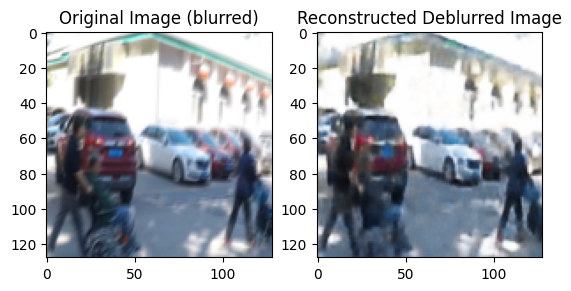

422/422 [==============================] - 5s 13ms/step - loss: 0.0024 - acc: 0.7933 - val_loss: 0.0080 - val_acc: 0.7585 - lr: 3.1623e-06
Epoch 52/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7932 - val_loss: 0.0080 - val_acc: 0.7592 - lr: 3.1623e-06
Epoch 53/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7933 - val_loss: 0.0080 - val_acc: 0.7586 - lr: 3.1623e-06
Epoch 54/100
421/422 [============================>.] - ETA: 0s - loss: 0.0024 - acc: 0.7933
Epoch 54: ReduceLROnPlateau reducing learning rate to 1.0000000553323957e-06.
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7933 - val_loss: 0.0080 - val_acc: 0.7587 - lr: 3.1623e-06
Epoch 55/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7934 - val_loss: 0.0080 - val_acc: 0.7583 - lr: 1.0000e-06
Epoch 56/100
1/1 [==============================] - 0s 21ms/step


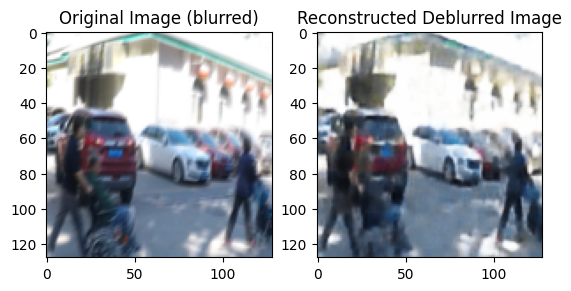

422/422 [==============================] - 5s 13ms/step - loss: 0.0024 - acc: 0.7932 - val_loss: 0.0080 - val_acc: 0.7590 - lr: 1.0000e-06
Epoch 57/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7934 - val_loss: 0.0080 - val_acc: 0.7585 - lr: 1.0000e-06
Epoch 58/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7933 - val_loss: 0.0080 - val_acc: 0.7587 - lr: 1.0000e-06
Epoch 59/100
421/422 [============================>.] - ETA: 0s - loss: 0.0024 - acc: 0.7933
Epoch 59: ReduceLROnPlateau reducing learning rate to 5e-07.
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7933 - val_loss: 0.0080 - val_acc: 0.7589 - lr: 1.0000e-06
Epoch 60/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7934 - val_loss: 0.0080 - val_acc: 0.7585 - lr: 5.0000e-07
Epoch 61/100
1/1 [==============================] - 0s 20ms/step


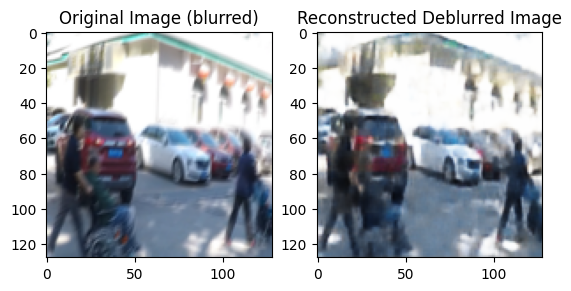

422/422 [==============================] - 5s 13ms/step - loss: 0.0024 - acc: 0.7933 - val_loss: 0.0080 - val_acc: 0.7585 - lr: 5.0000e-07
Epoch 62/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7933 - val_loss: 0.0080 - val_acc: 0.7586 - lr: 5.0000e-07
Epoch 63/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7934 - val_loss: 0.0080 - val_acc: 0.7585 - lr: 5.0000e-07
Epoch 64/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7933 - val_loss: 0.0080 - val_acc: 0.7587 - lr: 5.0000e-07
Epoch 65/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7933 - val_loss: 0.0080 - val_acc: 0.7587 - lr: 5.0000e-07
Epoch 66/100
1/1 [==============================] - 0s 22ms/step


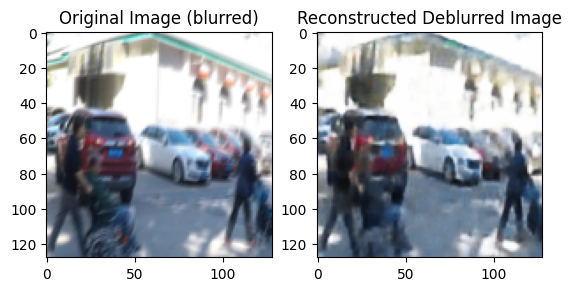

422/422 [==============================] - 5s 13ms/step - loss: 0.0024 - acc: 0.7933 - val_loss: 0.0080 - val_acc: 0.7586 - lr: 5.0000e-07
Epoch 67/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7933 - val_loss: 0.0080 - val_acc: 0.7587 - lr: 5.0000e-07
Epoch 68/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7933 - val_loss: 0.0080 - val_acc: 0.7587 - lr: 5.0000e-07
Epoch 69/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7934 - val_loss: 0.0080 - val_acc: 0.7584 - lr: 5.0000e-07
Epoch 70/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7933 - val_loss: 0.0080 - val_acc: 0.7585 - lr: 5.0000e-07
Epoch 71/100
1/1 [==============================] - 0s 20ms/step


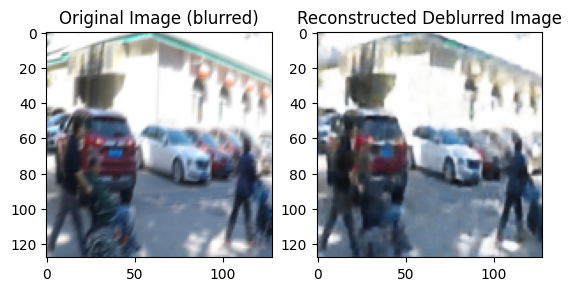

422/422 [==============================] - 5s 13ms/step - loss: 0.0024 - acc: 0.7933 - val_loss: 0.0080 - val_acc: 0.7586 - lr: 5.0000e-07
Epoch 72/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7934 - val_loss: 0.0080 - val_acc: 0.7586 - lr: 5.0000e-07
Epoch 73/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7934 - val_loss: 0.0080 - val_acc: 0.7585 - lr: 5.0000e-07
Epoch 74/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7934 - val_loss: 0.0080 - val_acc: 0.7585 - lr: 5.0000e-07
Epoch 75/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7934 - val_loss: 0.0080 - val_acc: 0.7585 - lr: 5.0000e-07
Epoch 76/100
1/1 [==============================] - 0s 28ms/step


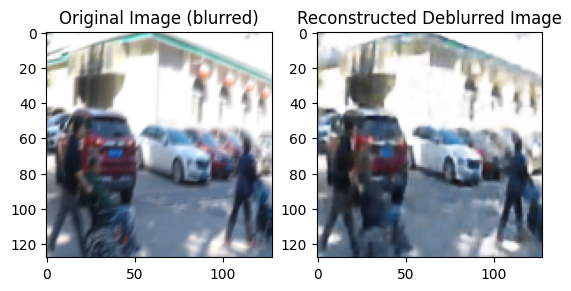

422/422 [==============================] - 6s 13ms/step - loss: 0.0024 - acc: 0.7933 - val_loss: 0.0080 - val_acc: 0.7585 - lr: 5.0000e-07
Epoch 77/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7933 - val_loss: 0.0080 - val_acc: 0.7586 - lr: 5.0000e-07
Epoch 78/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7934 - val_loss: 0.0080 - val_acc: 0.7586 - lr: 5.0000e-07
Epoch 79/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7933 - val_loss: 0.0080 - val_acc: 0.7586 - lr: 5.0000e-07
Epoch 80/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7933 - val_loss: 0.0080 - val_acc: 0.7586 - lr: 5.0000e-07
Epoch 81/100
1/1 [==============================] - 0s 21ms/step


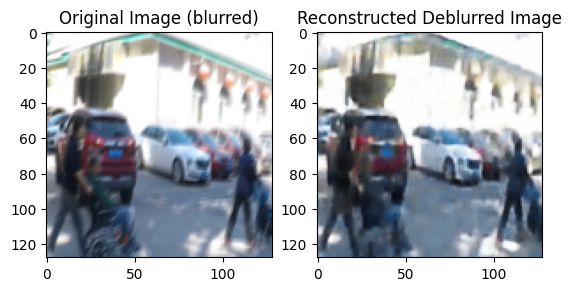

422/422 [==============================] - 6s 13ms/step - loss: 0.0024 - acc: 0.7934 - val_loss: 0.0080 - val_acc: 0.7585 - lr: 5.0000e-07
Epoch 82/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7933 - val_loss: 0.0080 - val_acc: 0.7587 - lr: 5.0000e-07
Epoch 83/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7933 - val_loss: 0.0080 - val_acc: 0.7587 - lr: 5.0000e-07
Epoch 84/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7934 - val_loss: 0.0080 - val_acc: 0.7586 - lr: 5.0000e-07
Epoch 85/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7934 - val_loss: 0.0080 - val_acc: 0.7587 - lr: 5.0000e-07
Epoch 86/100
1/1 [==============================] - 0s 20ms/step


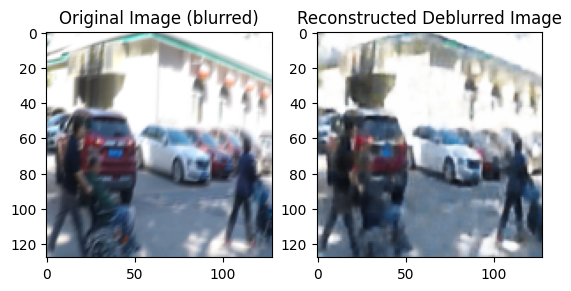

422/422 [==============================] - 5s 13ms/step - loss: 0.0024 - acc: 0.7934 - val_loss: 0.0080 - val_acc: 0.7586 - lr: 5.0000e-07
Epoch 87/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7933 - val_loss: 0.0080 - val_acc: 0.7587 - lr: 5.0000e-07
Epoch 88/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7934 - val_loss: 0.0080 - val_acc: 0.7585 - lr: 5.0000e-07
Epoch 89/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7934 - val_loss: 0.0080 - val_acc: 0.7585 - lr: 5.0000e-07
Epoch 90/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7933 - val_loss: 0.0080 - val_acc: 0.7586 - lr: 5.0000e-07
Epoch 91/100
1/1 [==============================] - 0s 21ms/step


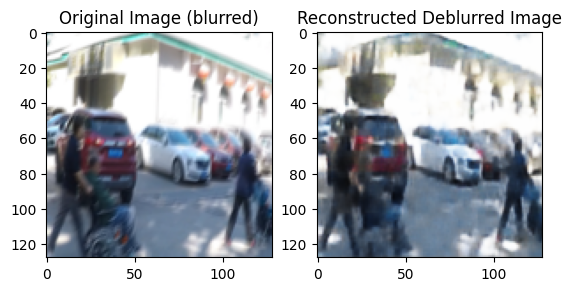

422/422 [==============================] - 5s 13ms/step - loss: 0.0024 - acc: 0.7934 - val_loss: 0.0080 - val_acc: 0.7585 - lr: 5.0000e-07
Epoch 92/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7934 - val_loss: 0.0080 - val_acc: 0.7585 - lr: 5.0000e-07
Epoch 93/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7934 - val_loss: 0.0080 - val_acc: 0.7586 - lr: 5.0000e-07
Epoch 94/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7933 - val_loss: 0.0080 - val_acc: 0.7586 - lr: 5.0000e-07
Epoch 95/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7934 - val_loss: 0.0080 - val_acc: 0.7586 - lr: 5.0000e-07
Epoch 96/100
1/1 [==============================] - 0s 21ms/step


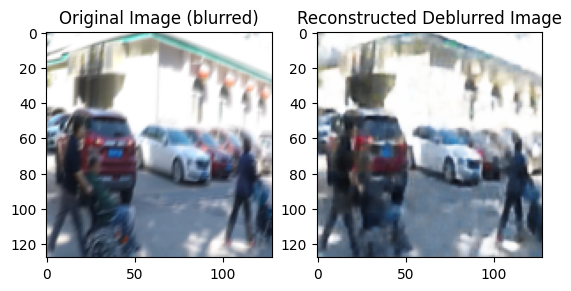

422/422 [==============================] - 6s 13ms/step - loss: 0.0024 - acc: 0.7934 - val_loss: 0.0080 - val_acc: 0.7585 - lr: 5.0000e-07
Epoch 97/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7934 - val_loss: 0.0080 - val_acc: 0.7586 - lr: 5.0000e-07
Epoch 98/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7933 - val_loss: 0.0080 - val_acc: 0.7586 - lr: 5.0000e-07
Epoch 99/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7934 - val_loss: 0.0080 - val_acc: 0.7587 - lr: 5.0000e-07
Epoch 100/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0024 - acc: 0.7935 - val_loss: 0.0080 - val_acc: 0.7586 - lr: 5.0000e-07


In [ ]:
# Train the model
history = autoencoder.fit(X_train,y_train,
                      validation_data=(X_test, y_test),
                      epochs=100,
                      batch_size=batch_size, callbacks=cbs)

# Saving the model as an .h5 file so that it can be loaded and used for deblurring
autoencoder.save(os.path.join(base_path,"deblur_autoencoder_final.h5"))

Plotting 3 random images with their deblurred image from the model and the ground truth side by sie to compare the results.

1/1 [==============================] - 0s 24ms/step


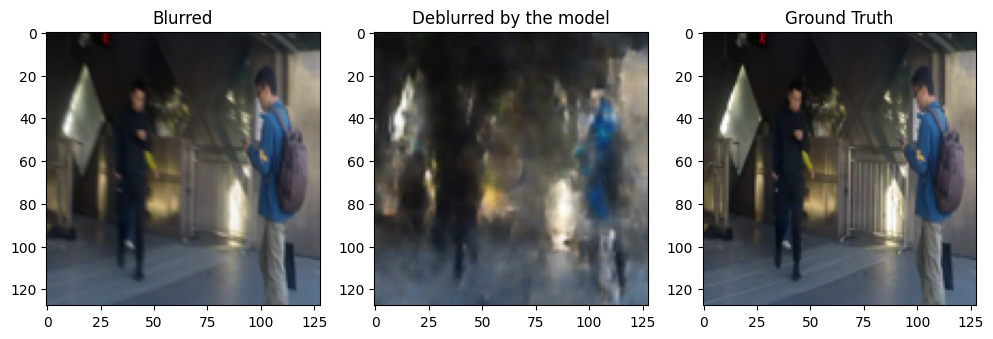

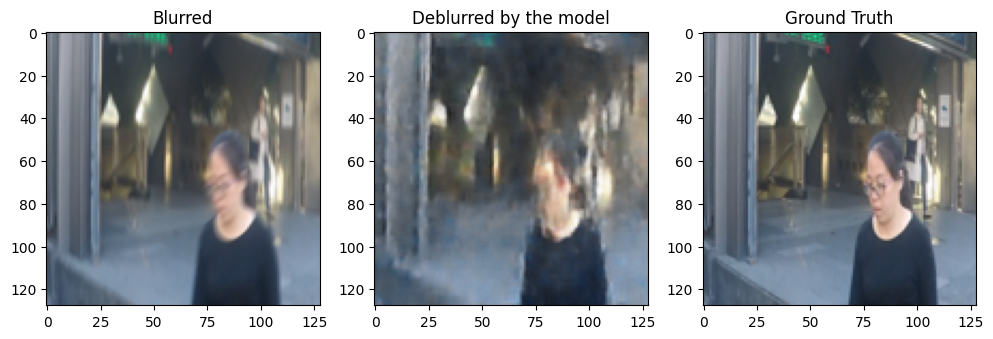

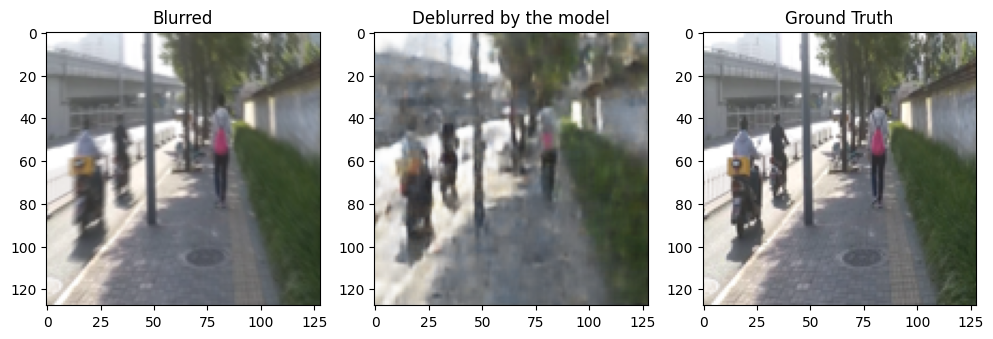

In [ ]:
for i in range(3):
    
    r = random.randint(0, len(y_test)-1)

    x, y = X_test[r],y_test[r]
    x_inp = x.reshape(1,128,128,3)
    result = autoencoder.predict(x_inp)
    result = result.reshape(128,128,3)

    fig = plt.figure(figsize=(12,10))
    fig.subplots_adjust(hspace=0.1, wspace=0.2)

    ax = fig.add_subplot(1, 3, 1)
    ax.imshow(x)
    ax.set_title('Blurred')

    ax = fig.add_subplot(1, 3, 2)
    plt.imshow(result)
    ax.set_title('Deblurred by the model')

    ax = fig.add_subplot(1, 3, 3)
    ax.imshow(y)
    ax.set_title('Ground Truth')

In [ ]:
def plotpredicted(index):
    fig, ax = plt.subplots(1,3, figsize=(12,6))

    result = autoencoder.predict(X_test[index].reshape(1,128,128,3))
    result = result.reshape(128,128,3)

    ax[0].imshow(X_test[index])
    ax[0].set_title("Blurred")
    ax[1].imshow(result)
    ax[1].set_title("Deblurred using model")
    ax[2].imshow(y_test[index])
    ax[2].set_title("Ground Truth")

1/1 [==============================] - 0s 23ms/step


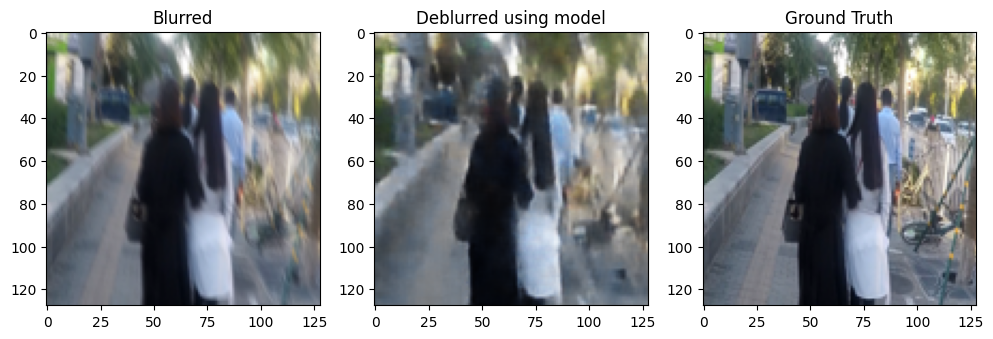

In [ ]:
plotpredicted(104)

In [ ]:
epochs = pd.DataFrame(history.history)

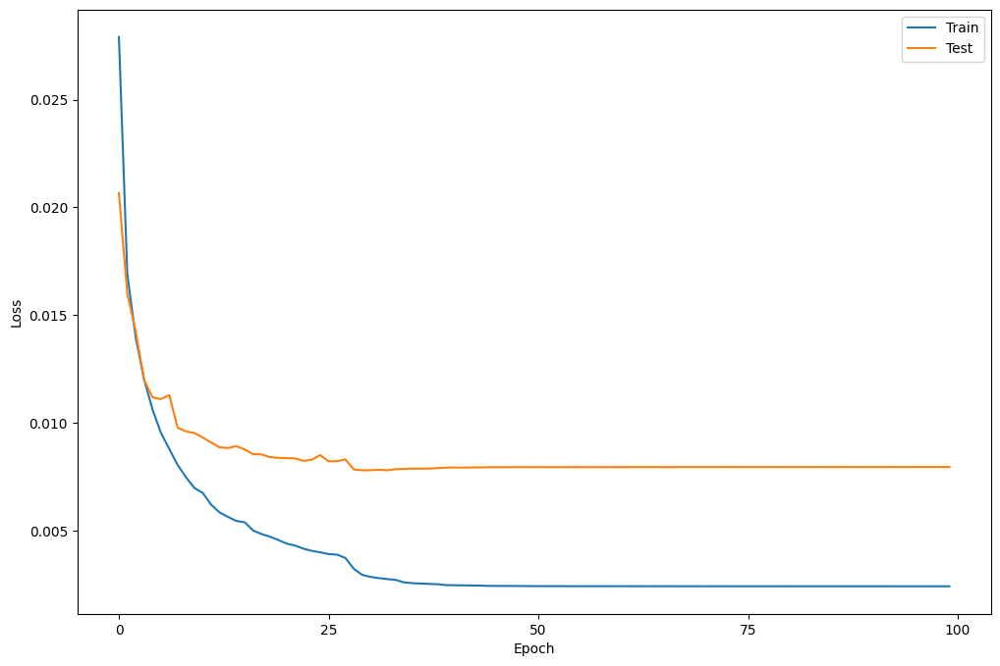

In [ ]:
plt.figure(figsize=(12,8))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['Train', 'Test'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.xticks(np.arange(0, 101, 25))
plt.show()

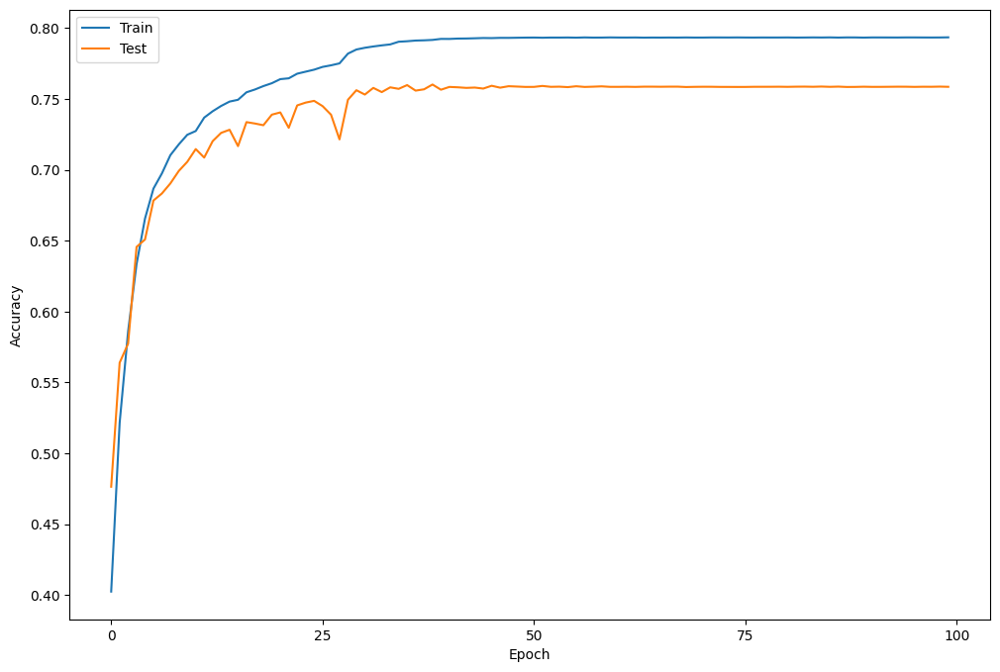

In [ ]:
plt.figure(figsize=(12,8))
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.legend(['Train', 'Test'])
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.xticks(np.arange(0, 101, 25))
plt.show()

## Trying different learning rate reducer

In [ ]:
autoencoder = Model(input_img, decoder(encoder(input_img)), name='autoencoder')
autoencoder.summary()

# Compile and train the model
autoencoder.compile(loss='mse', optimizer = 'adam', metrics=["acc"])

def exponential_decay(lr0, s):
    def exponential_decay_fn(epoch):
        return lr0 * 0.1**(epoch / s)
    return exponential_decay_fn

exponential_decay_fn = exponential_decay(lr0=0.01,s=5)

lr_scheduler = tf.keras.callbacks.LearningRateScheduler(exponential_decay_fn)

class ImageCallback(tf.keras.callbacks.Callback):
    def __init__(self, image, frequency):
        super(ImageCallback, self).__init__()
        self.image = image
        self.frequency = frequency

    def on_epoch_end(self, epoch, logs=None):
        if epoch % self.frequency == 0:
            reconstructed_image = self.model.predict(self.image.reshape(1,128,128,3))
            
            
            fig, ax = plt.subplots(1,2)
            ax[0].imshow(self.image)
            ax[0].set_title("Original Image (blurred)")
            ax[1].imshow(reconstructed_image[0])
            ax[1].set_title("Reconstructed Deblurred Image")
            plt.show()

image_callback = ImageCallback(X_test[22],frequency=5)
cbs = [lr_reducer, image_callback]

Model: "autoencoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 encoder (Functional)        (None, 256)               17148288  
                                                                 
 decoder (Functional)        (None, 128, 128, 3)       17803395  
                                                                 
Total params: 34,951,683
Trainable params: 34,951,683
Non-trainable params: 0
_________________________________________________________________


Epoch 1/100
1/1 [==============================] - 0s 143ms/step


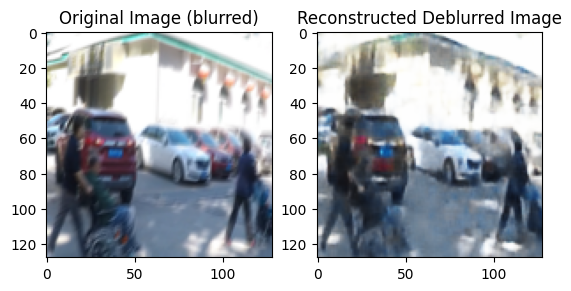

422/422 [==============================] - 10s 15ms/step - loss: 0.0025 - acc: 0.7931 - val_loss: 0.0080 - val_acc: 0.7586 - lr: 0.0010
Epoch 2/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0031 - acc: 0.7901 - val_loss: 0.0084 - val_acc: 0.7567 - lr: 0.0010
Epoch 3/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0032 - acc: 0.7896 - val_loss: 0.0083 - val_acc: 0.7578 - lr: 0.0010
Epoch 4/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0031 - acc: 0.7892 - val_loss: 0.0083 - val_acc: 0.7581 - lr: 0.0010
Epoch 5/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0030 - acc: 0.7907 - val_loss: 0.0081 - val_acc: 0.7618 - lr: 0.0010
Epoch 6/100
418/422 [============================>.] - ETA: 0s - loss: 0.0029 - acc: 0.7905
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.00031622778103685084.
1/1 [==============================] - 0s 21ms/step


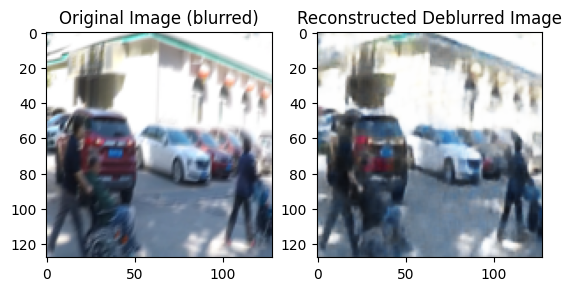

422/422 [==============================] - 5s 13ms/step - loss: 0.0029 - acc: 0.7904 - val_loss: 0.0080 - val_acc: 0.7500 - lr: 0.0010
Epoch 7/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0025 - acc: 0.7964 - val_loss: 0.0077 - val_acc: 0.7612 - lr: 3.1623e-04
Epoch 8/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0022 - acc: 0.7985 - val_loss: 0.0078 - val_acc: 0.7654 - lr: 3.1623e-04
Epoch 9/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0022 - acc: 0.7996 - val_loss: 0.0078 - val_acc: 0.7663 - lr: 3.1623e-04
Epoch 10/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0021 - acc: 0.8002 - val_loss: 0.0079 - val_acc: 0.7653 - lr: 3.1623e-04
Epoch 11/100
1/1 [==============================] - 0s 21ms/step


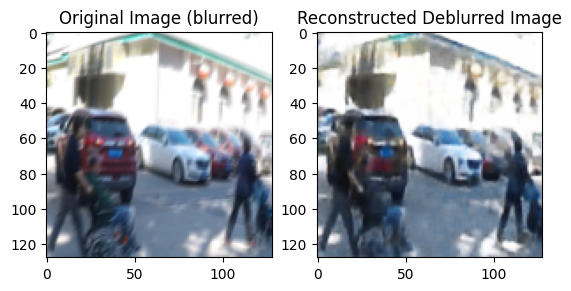

422/422 [==============================] - 5s 13ms/step - loss: 0.0021 - acc: 0.8006 - val_loss: 0.0079 - val_acc: 0.7662 - lr: 3.1623e-04
Epoch 12/100
421/422 [============================>.] - ETA: 0s - loss: 0.0021 - acc: 0.8011
Epoch 12: ReduceLROnPlateau reducing learning rate to 0.00010000000639606199.
422/422 [==============================] - 5s 12ms/step - loss: 0.0021 - acc: 0.8011 - val_loss: 0.0079 - val_acc: 0.7625 - lr: 3.1623e-04
Epoch 13/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0020 - acc: 0.8025 - val_loss: 0.0079 - val_acc: 0.7661 - lr: 1.0000e-04
Epoch 14/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0020 - acc: 0.8027 - val_loss: 0.0079 - val_acc: 0.7635 - lr: 1.0000e-04
Epoch 15/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0020 - acc: 0.8027 - val_loss: 0.0079 - val_acc: 0.7659 - lr: 1.0000e-04
Epoch 16/100
1/1 [==============================] - 0s 20ms/step


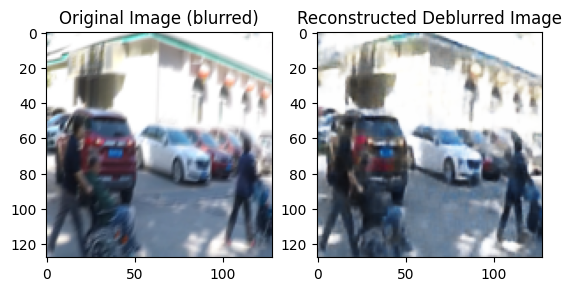

422/422 [==============================] - 5s 13ms/step - loss: 0.0019 - acc: 0.8031 - val_loss: 0.0080 - val_acc: 0.7669 - lr: 1.0000e-04
Epoch 17/100
419/422 [============================>.] - ETA: 0s - loss: 0.0019 - acc: 0.8031
Epoch 17: ReduceLROnPlateau reducing learning rate to 3.1622778103685084e-05.
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8031 - val_loss: 0.0079 - val_acc: 0.7664 - lr: 1.0000e-04
Epoch 18/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8037 - val_loss: 0.0080 - val_acc: 0.7661 - lr: 3.1623e-05
Epoch 19/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8037 - val_loss: 0.0080 - val_acc: 0.7667 - lr: 3.1623e-05
Epoch 20/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8038 - val_loss: 0.0080 - val_acc: 0.7661 - lr: 3.1623e-05
Epoch 21/100
1/1 [==============================] - 0s 20ms/step


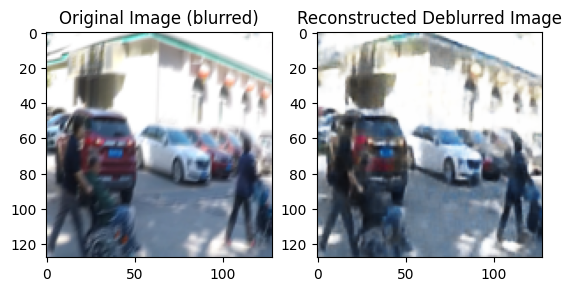

422/422 [==============================] - 5s 13ms/step - loss: 0.0019 - acc: 0.8039 - val_loss: 0.0080 - val_acc: 0.7642 - lr: 3.1623e-05
Epoch 22/100
419/422 [============================>.] - ETA: 0s - loss: 0.0019 - acc: 0.8040
Epoch 22: ReduceLROnPlateau reducing learning rate to 1.0000000409520217e-05.
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8040 - val_loss: 0.0080 - val_acc: 0.7660 - lr: 3.1623e-05
Epoch 23/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8041 - val_loss: 0.0080 - val_acc: 0.7649 - lr: 1.0000e-05
Epoch 24/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8041 - val_loss: 0.0080 - val_acc: 0.7661 - lr: 1.0000e-05
Epoch 25/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8041 - val_loss: 0.0080 - val_acc: 0.7656 - lr: 1.0000e-05
Epoch 26/100
1/1 [==============================] - 0s 20ms/step


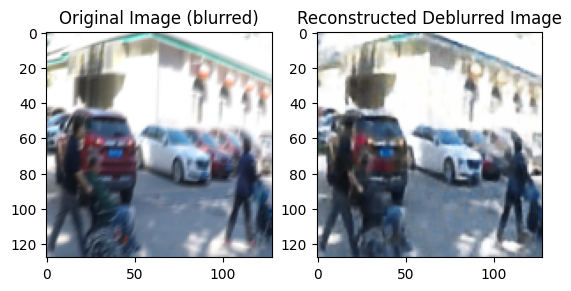

422/422 [==============================] - 5s 13ms/step - loss: 0.0019 - acc: 0.8041 - val_loss: 0.0080 - val_acc: 0.7660 - lr: 1.0000e-05
Epoch 27/100
421/422 [============================>.] - ETA: 0s - loss: 0.0019 - acc: 0.8042
Epoch 27: ReduceLROnPlateau reducing learning rate to 5e-06.
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8042 - val_loss: 0.0080 - val_acc: 0.7655 - lr: 1.0000e-05
Epoch 28/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8042 - val_loss: 0.0080 - val_acc: 0.7653 - lr: 5.0000e-06
Epoch 29/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8042 - val_loss: 0.0080 - val_acc: 0.7656 - lr: 5.0000e-06
Epoch 30/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8042 - val_loss: 0.0080 - val_acc: 0.7655 - lr: 5.0000e-06
Epoch 31/100
1/1 [==============================] - 0s 21ms/step


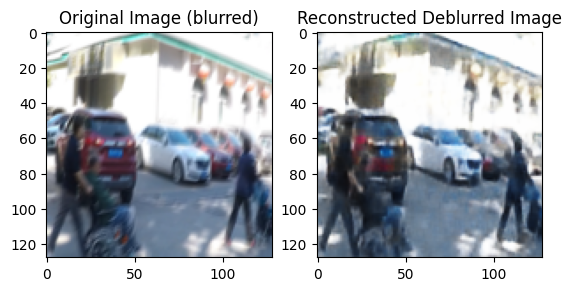

422/422 [==============================] - 5s 13ms/step - loss: 0.0019 - acc: 0.8043 - val_loss: 0.0080 - val_acc: 0.7649 - lr: 5.0000e-06
Epoch 32/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8042 - val_loss: 0.0080 - val_acc: 0.7655 - lr: 5.0000e-06
Epoch 33/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8042 - val_loss: 0.0080 - val_acc: 0.7654 - lr: 5.0000e-06
Epoch 34/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8043 - val_loss: 0.0080 - val_acc: 0.7655 - lr: 5.0000e-06
Epoch 35/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8043 - val_loss: 0.0080 - val_acc: 0.7650 - lr: 5.0000e-06
Epoch 36/100
1/1 [==============================] - 0s 21ms/step


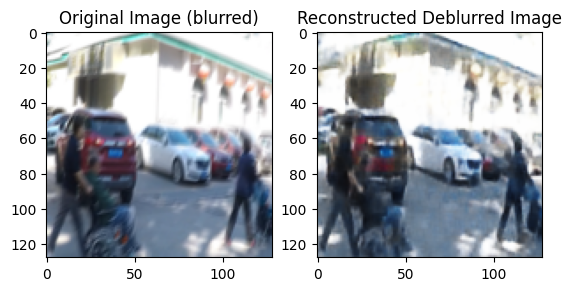

422/422 [==============================] - 5s 13ms/step - loss: 0.0019 - acc: 0.8043 - val_loss: 0.0080 - val_acc: 0.7655 - lr: 5.0000e-06
Epoch 37/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8043 - val_loss: 0.0080 - val_acc: 0.7650 - lr: 5.0000e-06
Epoch 38/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8043 - val_loss: 0.0080 - val_acc: 0.7656 - lr: 5.0000e-06
Epoch 39/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8043 - val_loss: 0.0080 - val_acc: 0.7650 - lr: 5.0000e-06
Epoch 40/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8044 - val_loss: 0.0080 - val_acc: 0.7658 - lr: 5.0000e-06
Epoch 41/100
1/1 [==============================] - 0s 21ms/step


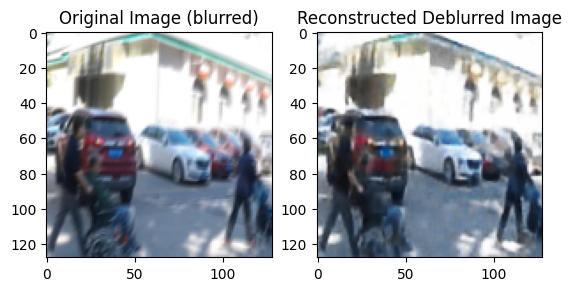

422/422 [==============================] - 5s 13ms/step - loss: 0.0019 - acc: 0.8043 - val_loss: 0.0080 - val_acc: 0.7651 - lr: 5.0000e-06
Epoch 42/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8043 - val_loss: 0.0080 - val_acc: 0.7662 - lr: 5.0000e-06
Epoch 43/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8044 - val_loss: 0.0080 - val_acc: 0.7656 - lr: 5.0000e-06
Epoch 44/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8044 - val_loss: 0.0080 - val_acc: 0.7650 - lr: 5.0000e-06
Epoch 45/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8043 - val_loss: 0.0080 - val_acc: 0.7656 - lr: 5.0000e-06
Epoch 46/100
1/1 [==============================] - 0s 21ms/step


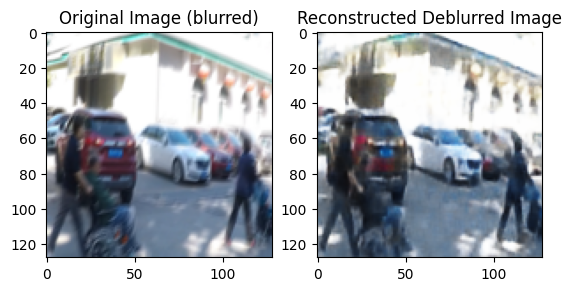

422/422 [==============================] - 5s 13ms/step - loss: 0.0019 - acc: 0.8044 - val_loss: 0.0080 - val_acc: 0.7655 - lr: 5.0000e-06
Epoch 47/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8044 - val_loss: 0.0080 - val_acc: 0.7649 - lr: 5.0000e-06
Epoch 48/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8043 - val_loss: 0.0080 - val_acc: 0.7656 - lr: 5.0000e-06
Epoch 49/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8045 - val_loss: 0.0080 - val_acc: 0.7647 - lr: 5.0000e-06
Epoch 50/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8044 - val_loss: 0.0080 - val_acc: 0.7653 - lr: 5.0000e-06
Epoch 51/100
1/1 [==============================] - 0s 21ms/step


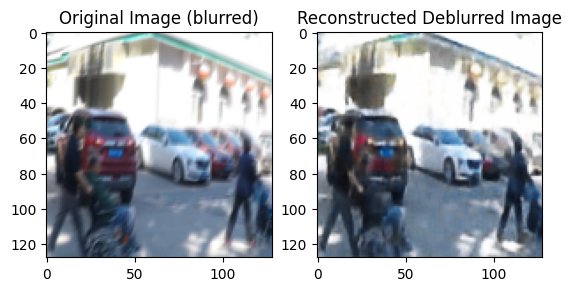

422/422 [==============================] - 5s 13ms/step - loss: 0.0019 - acc: 0.8044 - val_loss: 0.0080 - val_acc: 0.7656 - lr: 5.0000e-06
Epoch 52/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8044 - val_loss: 0.0080 - val_acc: 0.7656 - lr: 5.0000e-06
Epoch 53/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8044 - val_loss: 0.0080 - val_acc: 0.7651 - lr: 5.0000e-06
Epoch 54/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8044 - val_loss: 0.0080 - val_acc: 0.7659 - lr: 5.0000e-06
Epoch 55/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8045 - val_loss: 0.0080 - val_acc: 0.7655 - lr: 5.0000e-06
Epoch 56/100
1/1 [==============================] - 0s 20ms/step


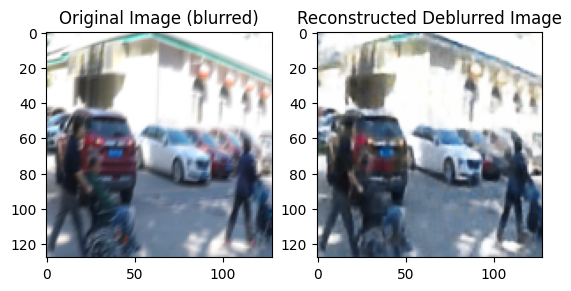

422/422 [==============================] - 5s 13ms/step - loss: 0.0019 - acc: 0.8045 - val_loss: 0.0080 - val_acc: 0.7653 - lr: 5.0000e-06
Epoch 57/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8045 - val_loss: 0.0080 - val_acc: 0.7658 - lr: 5.0000e-06
Epoch 58/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8045 - val_loss: 0.0080 - val_acc: 0.7660 - lr: 5.0000e-06
Epoch 59/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8045 - val_loss: 0.0080 - val_acc: 0.7661 - lr: 5.0000e-06
Epoch 60/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8046 - val_loss: 0.0080 - val_acc: 0.7653 - lr: 5.0000e-06
Epoch 61/100
1/1 [==============================] - 0s 21ms/step


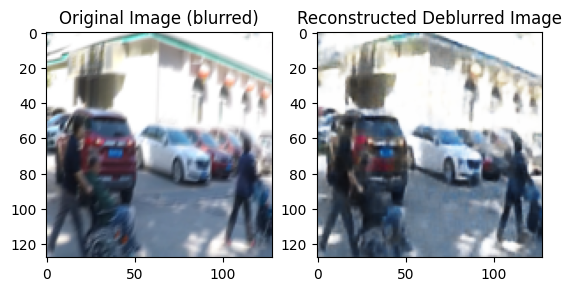

422/422 [==============================] - 5s 13ms/step - loss: 0.0019 - acc: 0.8045 - val_loss: 0.0080 - val_acc: 0.7653 - lr: 5.0000e-06
Epoch 62/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8045 - val_loss: 0.0080 - val_acc: 0.7655 - lr: 5.0000e-06
Epoch 63/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8045 - val_loss: 0.0080 - val_acc: 0.7657 - lr: 5.0000e-06
Epoch 64/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8046 - val_loss: 0.0080 - val_acc: 0.7664 - lr: 5.0000e-06
Epoch 65/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8045 - val_loss: 0.0080 - val_acc: 0.7657 - lr: 5.0000e-06
Epoch 66/100
1/1 [==============================] - 0s 21ms/step


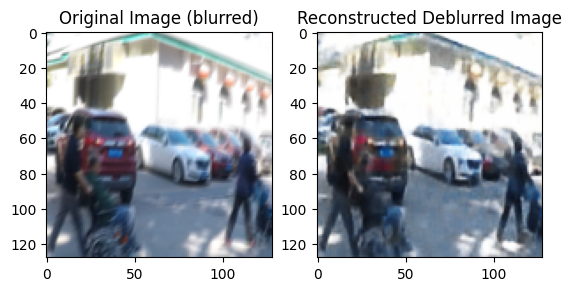

422/422 [==============================] - 5s 13ms/step - loss: 0.0019 - acc: 0.8046 - val_loss: 0.0080 - val_acc: 0.7661 - lr: 5.0000e-06
Epoch 67/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8046 - val_loss: 0.0080 - val_acc: 0.7659 - lr: 5.0000e-06
Epoch 68/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8046 - val_loss: 0.0080 - val_acc: 0.7651 - lr: 5.0000e-06
Epoch 69/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8046 - val_loss: 0.0080 - val_acc: 0.7657 - lr: 5.0000e-06
Epoch 70/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8046 - val_loss: 0.0080 - val_acc: 0.7660 - lr: 5.0000e-06
Epoch 71/100
1/1 [==============================] - 0s 21ms/step


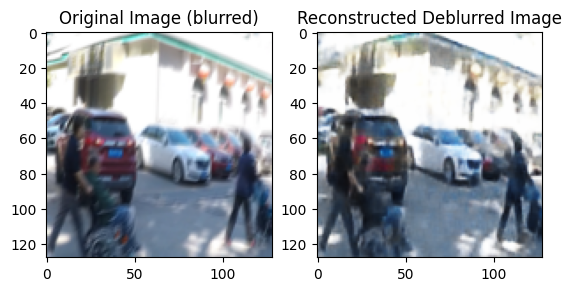

422/422 [==============================] - 5s 13ms/step - loss: 0.0019 - acc: 0.8047 - val_loss: 0.0080 - val_acc: 0.7655 - lr: 5.0000e-06
Epoch 72/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8046 - val_loss: 0.0080 - val_acc: 0.7661 - lr: 5.0000e-06
Epoch 73/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8046 - val_loss: 0.0080 - val_acc: 0.7666 - lr: 5.0000e-06
Epoch 74/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8046 - val_loss: 0.0080 - val_acc: 0.7653 - lr: 5.0000e-06
Epoch 75/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8047 - val_loss: 0.0080 - val_acc: 0.7654 - lr: 5.0000e-06
Epoch 76/100
1/1 [==============================] - 0s 21ms/step


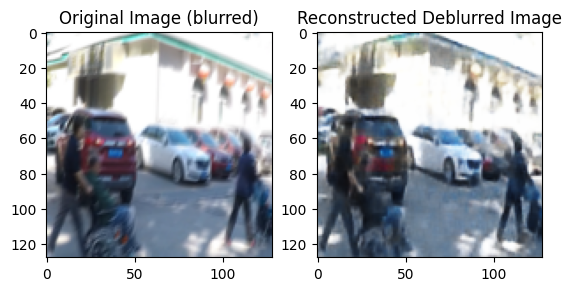

422/422 [==============================] - 5s 13ms/step - loss: 0.0019 - acc: 0.8046 - val_loss: 0.0080 - val_acc: 0.7653 - lr: 5.0000e-06
Epoch 77/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8046 - val_loss: 0.0080 - val_acc: 0.7660 - lr: 5.0000e-06
Epoch 78/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8047 - val_loss: 0.0080 - val_acc: 0.7659 - lr: 5.0000e-06
Epoch 79/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8047 - val_loss: 0.0080 - val_acc: 0.7654 - lr: 5.0000e-06
Epoch 80/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8047 - val_loss: 0.0080 - val_acc: 0.7658 - lr: 5.0000e-06
Epoch 81/100
1/1 [==============================] - 0s 20ms/step


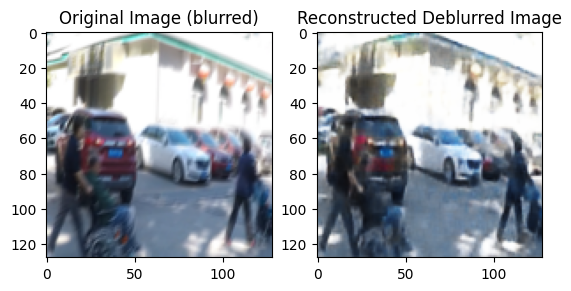

422/422 [==============================] - 5s 13ms/step - loss: 0.0019 - acc: 0.8047 - val_loss: 0.0080 - val_acc: 0.7658 - lr: 5.0000e-06
Epoch 82/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8047 - val_loss: 0.0080 - val_acc: 0.7654 - lr: 5.0000e-06
Epoch 83/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8047 - val_loss: 0.0080 - val_acc: 0.7657 - lr: 5.0000e-06
Epoch 84/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8047 - val_loss: 0.0080 - val_acc: 0.7659 - lr: 5.0000e-06
Epoch 85/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8048 - val_loss: 0.0080 - val_acc: 0.7659 - lr: 5.0000e-06
Epoch 86/100
1/1 [==============================] - 0s 21ms/step


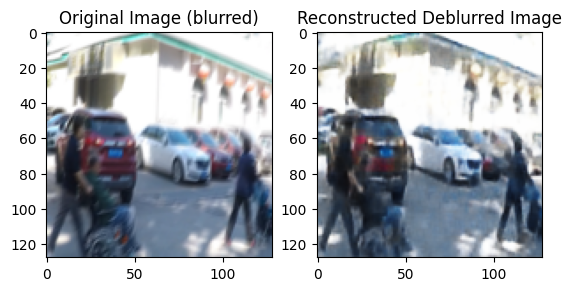

422/422 [==============================] - 5s 13ms/step - loss: 0.0019 - acc: 0.8048 - val_loss: 0.0080 - val_acc: 0.7654 - lr: 5.0000e-06
Epoch 87/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8047 - val_loss: 0.0080 - val_acc: 0.7658 - lr: 5.0000e-06
Epoch 88/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8047 - val_loss: 0.0080 - val_acc: 0.7660 - lr: 5.0000e-06
Epoch 89/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8047 - val_loss: 0.0080 - val_acc: 0.7662 - lr: 5.0000e-06
Epoch 90/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8048 - val_loss: 0.0080 - val_acc: 0.7653 - lr: 5.0000e-06
Epoch 91/100
1/1 [==============================] - 0s 21ms/step


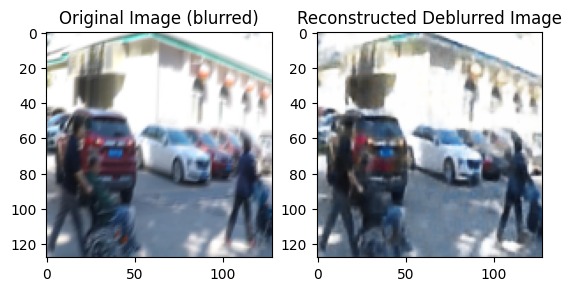

422/422 [==============================] - 5s 13ms/step - loss: 0.0019 - acc: 0.8048 - val_loss: 0.0080 - val_acc: 0.7661 - lr: 5.0000e-06
Epoch 92/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8048 - val_loss: 0.0080 - val_acc: 0.7657 - lr: 5.0000e-06
Epoch 93/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8049 - val_loss: 0.0080 - val_acc: 0.7656 - lr: 5.0000e-06
Epoch 94/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8048 - val_loss: 0.0080 - val_acc: 0.7657 - lr: 5.0000e-06
Epoch 95/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8048 - val_loss: 0.0080 - val_acc: 0.7656 - lr: 5.0000e-06
Epoch 96/100
1/1 [==============================] - 0s 22ms/step


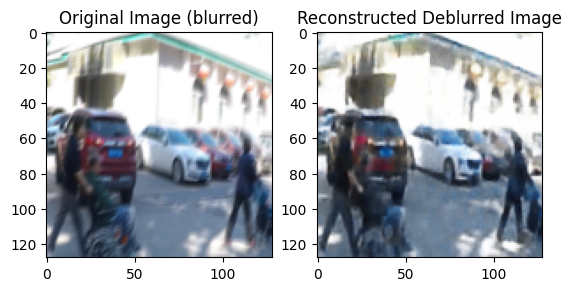

422/422 [==============================] - 5s 13ms/step - loss: 0.0019 - acc: 0.8048 - val_loss: 0.0080 - val_acc: 0.7661 - lr: 5.0000e-06
Epoch 97/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8049 - val_loss: 0.0080 - val_acc: 0.7656 - lr: 5.0000e-06
Epoch 98/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8048 - val_loss: 0.0080 - val_acc: 0.7657 - lr: 5.0000e-06
Epoch 99/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8049 - val_loss: 0.0080 - val_acc: 0.7649 - lr: 5.0000e-06
Epoch 100/100
422/422 [==============================] - 5s 12ms/step - loss: 0.0019 - acc: 0.8048 - val_loss: 0.0080 - val_acc: 0.7656 - lr: 5.0000e-06


In [ ]:
history2 = autoencoder.fit(X_train,y_train,
                      validation_data=(X_test, y_test),
                      epochs=100,
                      batch_size=batch_size, callbacks=cbs)
autoencoder.save(os.path.join(base_path,"deblur_autoencoder_final_lr2.h5"))

1/1 [==============================] - 0s 22ms/step


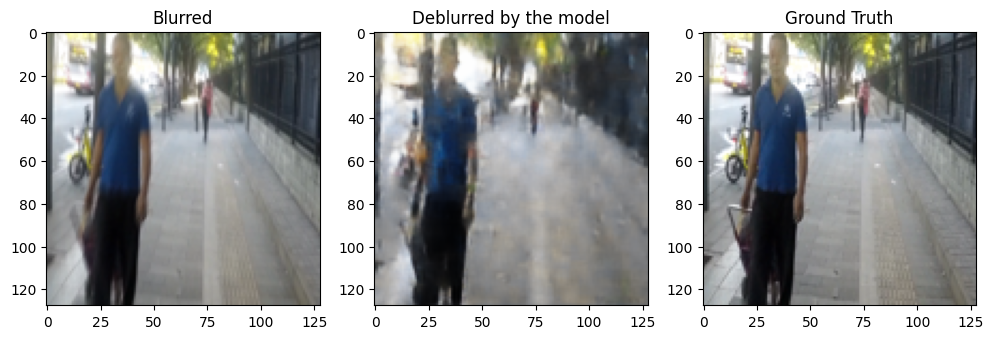

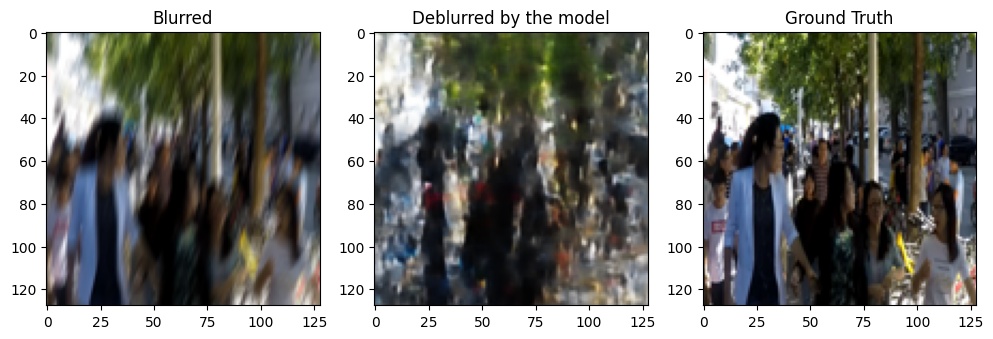

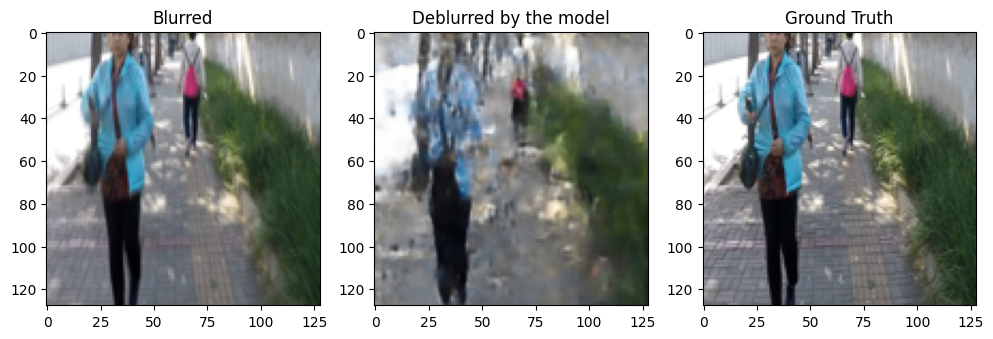

In [ ]:
for i in range(3):
    
    r = random.randint(0, len(y_test)-1)

    x, y = X_test[r],y_test[r]
    x_inp = x.reshape(1,128,128,3)
    result = autoencoder.predict(x_inp)
    result = result.reshape(128,128,3)

    fig = plt.figure(figsize=(12,10))
    fig.subplots_adjust(hspace=0.1, wspace=0.2)

    ax = fig.add_subplot(1, 3, 1)
    ax.imshow(x)
    ax.set_title('Blurred')

    ax = fig.add_subplot(1, 3, 2)
    plt.imshow(result)
    ax.set_title('Deblurred by the model')

    ax = fig.add_subplot(1, 3, 3)
    ax.imshow(y)
    ax.set_title('Ground Truth')

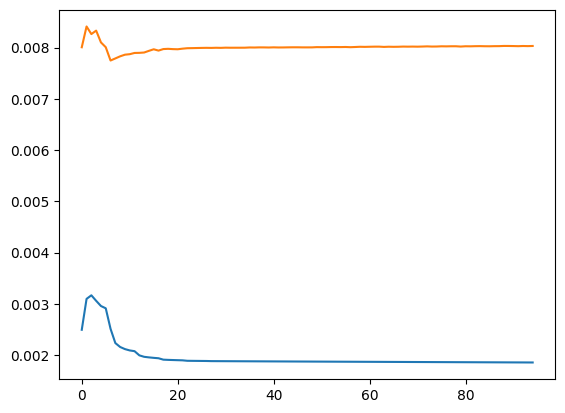

In [ ]:
epochs2 = pd.DataFrame(history2.history)
plt.plot(epochs2['loss'][:-5])
plt.plot(epochs2["val_loss"][:-5])

## Generative Adversarial Networks (GANs)

GANs are basically combination of two neural networks - generator and discriminator.

The generator network is typically a neural network that takes as input a blurry image and generates a deblurred image. The discriminator network is also a neural network that takes as input an image (either a real non-blurry image or a generated deblurred image) and outputs a probability of whether the input image is real or generated.

During training, the generator network is trained to produce images that are similar to real non-blurry images, while the discriminator network is trained to distinguish between real and generated images. The generator and discriminator networks are trained in a minimax game where the generator tries to minimize the discriminator's ability to distinguish between real and generated images, while the discriminator tries to maximize its ability to do so. Just like a game of tug of war these two networks compete with each other.

Over time, the generator network becomes better at producing deblurred images that are indistinguishable from real non-blurry images, while the discriminator becomes better at distinguishing between real and generated images. Once the GAN has been trained, the generator network can be used to deblur new images. 

Due to the complexity of GANs and time constraint the plan to create this model was scrapped for now. This is the future scope in this project which I will follow up with soon.

# Conclusion

The initial learning reducer worked better as it reconstructed images better than the exponential learning rate reducers. I tried training models for multiple parameters and saved the trained models as .h5 files so that I can have something to compare.
The model achieved accuracy of about 80% which is decent enough considering the computational limitation. The trained .h5 file can be loaded and used to reconstruct a blurred image.

There are some caveats which I noticed while testing the trained model on blurred images. If the image is too blurred the model is able to deblur it. In some cases, the image is focused on an object and the background is slightly blurred due to focus, that is identified as blur and it completely messes up the reconstructed image. This model works best for slightly blurred images.

Future work would be to add more number of filters and layers to the model. This will increase the complexity of the model but will reconstruct images much better than this model.

# References:

1. [HIDE (High-quality Dyanamic Images with Extensive motion)](https://github.com/joanshen0508/HA_deblur) dataset

2. Kuntala C. (2022), "Image Deblurring using Convolutional Autoencoders" Towards Data science, url = "https://medium.com/mlearning-ai/image-deblurring-using-convolutional-autoencoders-deep-learning-project-tutorial-329f87a4c6ad", Accessed: 9th May 2023

3. [Keras Documentation](https://keras.io/api/layers/activations/) Accessed: 9th May 2023

4. [CNN Explainer](https://poloclub.github.io/cnn-explainer/) Accessed: 9th May 2023